In [2]:
!pip install retina-face

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from retinaface import RetinaFace
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

In [4]:
import cv2
import os
coordinates= []

def load_images_from_folder(folder):
  i = 0
  
  for filename in os.listdir(folder):
    img = os.path.join(folder,filename)
    
    
    if img is not None and i < 10:
      # image = Image.open(img)
      # draw = ImageDraw.Draw(image)

      # print(img)
      i += 1
      resp = RetinaFace.detect_faces(img)
      coordinates.append(resp) 
      image = Image.open(img)
      plt.imshow(image)
      plt.show()
  return coordinates

Directory  /root /.deepface created
Directory  /root /.deepface/weights created
retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5
100%|██████████| 119M/119M [00:01<00:00, 62.9MB/s]


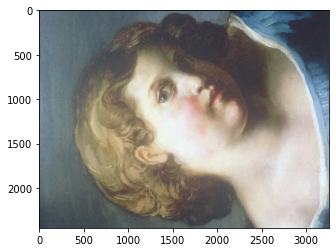

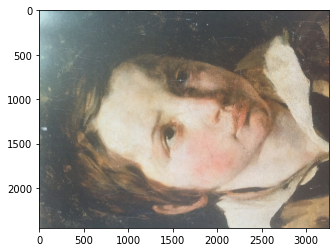

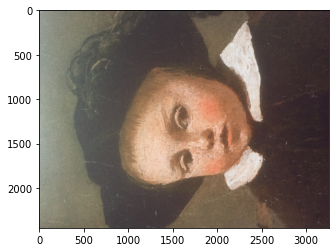

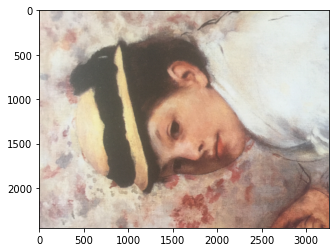

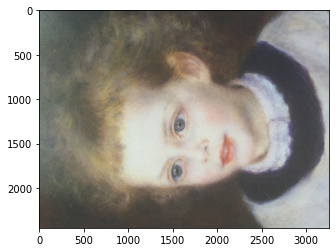

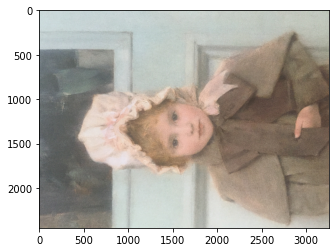

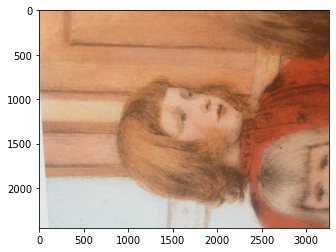

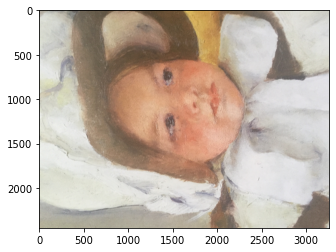

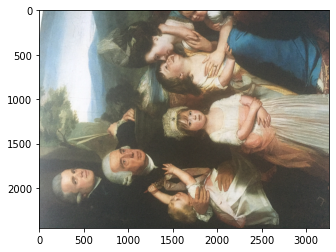

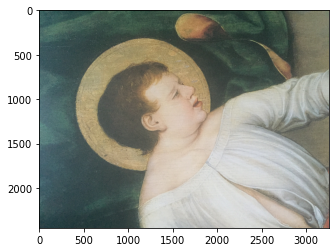

In [5]:
faces = load_images_from_folder('/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants')

In [ ]:
faces

[{'face_1': {'score': 0.9989205002784729,
   'facial_area': [23, 38, 70, 89],
   'landmarks': {'right_eye': [32.33581, 64.72384],
    'left_eye': [52.03277, 58.72718],
    'nose': [42.451782, 74.76874],
    'mouth_right': [42.51659, 83.998276],
    'mouth_left': [55.255547, 78.70442]}}},
 {'face_1': {'score': 0.9992787837982178,
   'facial_area': [1043, 982, 2087, 2230],
   'landmarks': {'right_eye': [1493.915, 1420.5206],
    'left_eye': [1899.7262, 1561.6678],
    'nose': [1670.3926, 1810.27],
    'mouth_right': [1377.3745, 1916.5995],
    'mouth_left': [1633.9071, 2032.6147]}}},
 {'face_1': {'score': 0.9982383251190186,
   'facial_area': [483, 794, 1943, 2593],
   'landmarks': {'right_eye': [1071.9933, 1430.9127],
    'left_eye': [1710.0319, 1572.0101],
    'nose': [1415.2511, 1982.8987],
    'mouth_right': [990.82385, 2162.0286],
    'mouth_left': [1440.8917, 2276.6108]}}},
 {'face_1': {'score': 0.999645471572876,
   'facial_area': [555, 1039, 1663, 2419],
   'landmarks': {'right_e

In [ ]:
facial_areas = [face['face_1']['facial_area'] for face in faces]


In [ ]:
facial_areas

[[23, 38, 70, 89],
 [1043, 982, 2087, 2230],
 [483, 794, 1943, 2593],
 [555, 1039, 1663, 2419],
 [627, 1073, 1552, 2287],
 [455, 989, 1578, 2426],
 [813, 1248, 1404, 1952],
 [777, 1211, 1584, 2287],
 [768, 848, 1919, 2310],
 [1857, 1191, 2093, 1528]]

In [ ]:
# import cv2
# import os
# # coordinates= []

# def make_images_from_folder(folder):
#   i = 0
  
#   for filename in os.listdir(folder):
#     img = os.path.join(folder,filename)
    
    
#     if img is not None and i < 10:
#       image = Image.open(img)
#       draw = ImageDraw.Draw(image)
#       # Get the facial area coordinates for the first face
#       facial_area = faces[i]['face_1']['facial_area']
#       x1, y1, x2, y2 = facial_area[0], facial_area[1], facial_area[2], facial_area[3]
#       # Draw a red square over the facial area
#       draw.rectangle((x1, y1, x2, y2), outline="red", width=10)
#       plt.imshow(image)
#       plt.show()
      
#       i += 1
#       # Save the modified image
#       # image.save("img {}.jpg".format(i))
      

In [ ]:
# make_images_from_folder('/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants')

{'face_1': {'score': 0.9989205002784729, 'facial_area': [23, 38, 70, 89], 'landmarks': {'right_eye': [32.33581, 64.72384], 'left_eye': [52.03277, 58.72718], 'nose': [42.451782, 74.76874], 'mouth_right': [42.51659, 83.998276], 'mouth_left': [55.255547, 78.70442]}}}


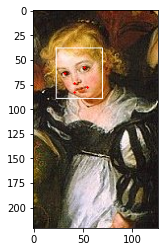

False

In [6]:
from retinaface import RetinaFace
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import numpy as np

img_path = "/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg"
img = cv2.imread(img_path)

resp = RetinaFace.detect_faces(img_path, threshold = 0.1)
print(resp)

def int_tuple(t):
    return tuple(int(x) for x in t)

for key in resp:
    identity = resp[key]

    #---------------------
    confidence = identity["score"]

    rectangle_color = (255, 255, 255)

    landmarks = identity["landmarks"]
    diameter = 1
    cv2.circle(img, int_tuple(landmarks["left_eye"]), diameter, (0, 0, 255), -1)
    cv2.circle(img, int_tuple(landmarks["right_eye"]), diameter, (0, 0, 255), -1)
    cv2.circle(img, int_tuple(landmarks["nose"]), diameter, (0, 0, 255), -1)
    cv2.circle(img, int_tuple(landmarks["mouth_left"]), diameter, (0, 0, 255), -1)
    cv2.circle(img, int_tuple(landmarks["mouth_right"]), diameter, (0, 0, 255), -1)

    facial_area = identity["facial_area"]

    cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), rectangle_color, 1)
    facial_img = img[facial_area[1]: facial_area[3], facial_area[0]: facial_area[2]]
    plt.imshow(facial_img[:, :, ::-1])

plt.imshow(img[:, :, ::-1])
# plt.axis('off')
plt.show()
cv2.imwrite('outputs/output_1.jpg', img)
#so vertex is (38,89) and opp vertex is (23,70), cv2 has(y,x) for points - doens't add up

In [7]:
folder = '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants'

{'face_1': {'score': 0.9992787837982178, 'facial_area': [1043, 982, 2087, 2230], 'landmarks': {'right_eye': [1493.915, 1420.5206], 'left_eye': [1899.7262, 1561.6678], 'nose': [1670.3926, 1810.27], 'mouth_right': [1377.3745, 1916.5995], 'mouth_left': [1633.9071, 2032.6147]}}}


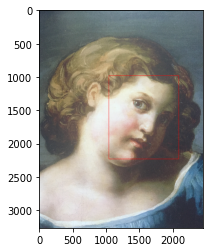

{'face_1': {'score': 0.9982383251190186, 'facial_area': [483, 794, 1943, 2593], 'landmarks': {'right_eye': [1071.9933, 1430.9127], 'left_eye': [1710.0319, 1572.0101], 'nose': [1415.2511, 1982.8987], 'mouth_right': [990.82385, 2162.0286], 'mouth_left': [1440.8917, 2276.6108]}}}


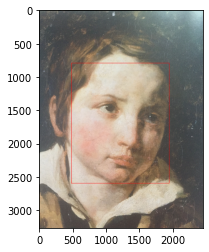

{'face_1': {'score': 0.999645471572876, 'facial_area': [555, 1039, 1663, 2419], 'landmarks': {'right_eye': [758.2024, 1606.4082], 'left_eye': [1235.8315, 1614.4525], 'nose': [908.40967, 1888.4293], 'mouth_right': [807.70483, 2117.3757], 'mouth_left': [1183.8961, 2124.4023]}}}


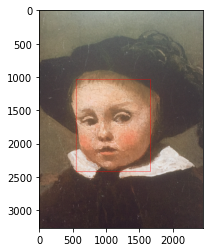

In [9]:
i = 0
for filename in os.listdir(folder):
    img_path = os.path.join(folder,filename)
    # continue
    # continue
    
    if i < 3:
      
      i += 1
      img = cv2.imread(img_path)

      resp = RetinaFace.detect_faces(img_path, threshold = 0.1)
      print(resp)

      def int_tuple(t):
          return tuple(int(x) for x in t)

      for key in resp:
          identity = resp[key]

          #---------------------
          confidence = identity["score"]

          rectangle_color = (0, 0, 255)                #(255, 255, 255)

          landmarks = identity["landmarks"]
          diameter = 1
          cv2.circle(img, int_tuple(landmarks["left_eye"]), diameter, (0, 0, 255), -1)
          cv2.circle(img, int_tuple(landmarks["right_eye"]), diameter, (0, 0, 255), -1)
          cv2.circle(img, int_tuple(landmarks["nose"]), diameter, (0, 0, 255), -1)
          cv2.circle(img, int_tuple(landmarks["mouth_left"]), diameter, (0, 0, 255), -1)
          cv2.circle(img, int_tuple(landmarks["mouth_right"]), diameter, (0, 0, 255), -1)

          facial_area = identity["facial_area"]

          cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), rectangle_color, 3)
          facial_img = img[facial_area[1]: facial_area[3], facial_area[0]: facial_area[2]]
          plt.imshow(facial_img[:, :, ::-1])

      plt.imshow(img[:, :, ::-1])
      # plt.axis('off')
      plt.show()
      cv2.imwrite('outputs/output_1.jpg', img)
      # resp = RetinaFace.detect_faces(img)
      # coordinates.append(resp) 
      # image = Image.open(img)
      # plt.imshow(image)
      # plt.show()

In [ ]:
!pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 22.0 MB/s eta 0:00:00


In [ ]:
#what if we just create a bounding box based on mouth coordinates, or add haar cascade, check if the dot from here is in the box 
#if it is, we use those boxes, but theyre stupid or just choose the size of the bounding box after rescaling images, and use them with ht edot as the center

In [ ]:
import cv2
from mtcnn import MTCNN

detector = MTCNN()

image = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg"), cv2.COLOR_BGR2RGB)
result = detector.detect_faces(image)

# Result is an array with all the bounding boxes detected. We know that for 'ivan.jpg' there is only one.
bounding_box = result[0]['box']
keypoints = result[0]['keypoints']

cv2.rectangle(image,
              (bounding_box[0], bounding_box[1]),
              (bounding_box[0]+bounding_box[2], bounding_box[1] + bounding_box[3]),
              (0,155,255),
              2)

cv2.circle(image,(keypoints['left_eye']), 2, (0,155,255), 2)
cv2.circle(image,(keypoints['right_eye']), 2, (0,155,255), 2)
cv2.circle(image,(keypoints['nose']), 2, (0,155,255), 2)
cv2.circle(image,(keypoints['mouth_left']), 2, (0,155,255), 2)
cv2.circle(image,(keypoints['mouth_right']), 2, (0,155,255), 2)
plt.show()
cv2.imwrite("ivan_drawn.jpg", cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

print(result)

1/1 [==============================] - 0s 476ms/step
[{'box': [30, 42, 41, 51], 'confidence': 0.9991490244865417, 'keypoints': {'left_eye': (35, 64), 'right_eye': (52, 59), 'nose': (42, 73), 'mouth_left': (42, 83), 'mouth_right': (55, 79)}}]


In [14]:
#resizing images
import cv2

def resize_image(img_path, max_size=1024):
    # Read the image
    img = cv2.imread(img_path)

    # Get the original image dimensions
    height, width = img.shape[:2]

    # Determine the longer side of the image
    if height > width:
        long_side = height
    else:
        long_side = width

    # Calculate the scaling factor to fit the longer side to the maximum size
    scale = max_size / long_side

    # Resize the image
    img = cv2.resize(img, (int(width*scale), int(height*scale)))

    return img


In [15]:
i = 0
dimensions = []
img_array = []
for filename in os.listdir(folder):
    img_path = os.path.join(folder,filename)
    # continue
    # continue
    
    if i < 10:
      img_array.append(img_path)
      i += 1
      img = resize_image(img_path)
      # img = cv2.imread(img_path)
      print(img.shape[:2])
      resp = RetinaFace.detect_faces(img_path, threshold = 0.1)
      print(resp)
      dimensions.append(resp)

      

(1024, 768)
{'face_1': {'score': 0.9992787837982178, 'facial_area': [1043, 982, 2087, 2230], 'landmarks': {'right_eye': [1493.915, 1420.5206], 'left_eye': [1899.7262, 1561.6678], 'nose': [1670.3926, 1810.27], 'mouth_right': [1377.3745, 1916.5995], 'mouth_left': [1633.9071, 2032.6147]}}}
(1024, 768)
{'face_1': {'score': 0.9982383251190186, 'facial_area': [483, 794, 1943, 2593], 'landmarks': {'right_eye': [1071.9933, 1430.9127], 'left_eye': [1710.0319, 1572.0101], 'nose': [1415.2511, 1982.8987], 'mouth_right': [990.82385, 2162.0286], 'mouth_left': [1440.8917, 2276.6108]}}}
(1024, 768)
{'face_1': {'score': 0.999645471572876, 'facial_area': [555, 1039, 1663, 2419], 'landmarks': {'right_eye': [758.2024, 1606.4082], 'left_eye': [1235.8315, 1614.4525], 'nose': [908.40967, 1888.4293], 'mouth_right': [807.70483, 2117.3757], 'mouth_left': [1183.8961, 2124.4023]}}}
(1024, 768)
{'face_1': {'score': 0.9991530776023865, 'facial_area': [627, 1073, 1552, 2287], 'landmarks': {'right_eye': [709.18365, 1

In [16]:
img_array

['/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4932.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4933.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4936.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4942.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4947.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4948.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4951.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4954.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4961.JPG',
 '/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/IMG_4983.JPG']

In [13]:
#we have to resize the image to the model demand, but i cant find the model demand. so we align, 

In [ ]:
for 

[1899.7262, 1561.6678]
(1248, 1044)


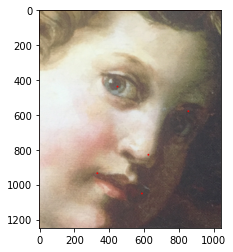

[1710.0319, 1572.0101]
(1799, 1460)


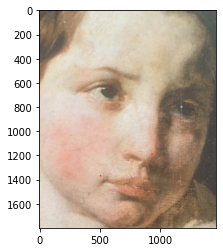

[1235.8315, 1614.4525]
(1380, 1108)


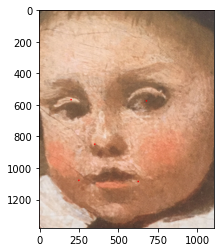

[1063.5482, 1539.5223]
(1214, 925)


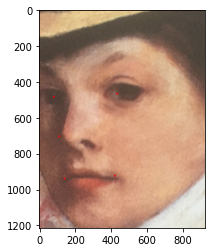

[1158.5697, 1590.2415]
(1437, 1123)


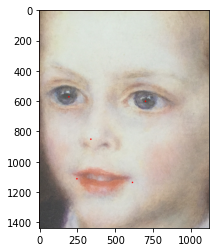

[1257.0698, 1516.4664]
(704, 591)


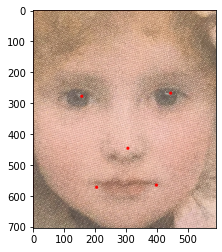

[1455.4847, 1694.209]
(1076, 807)
[738.82434, 3270.049]


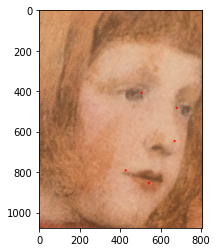

(656, 990)


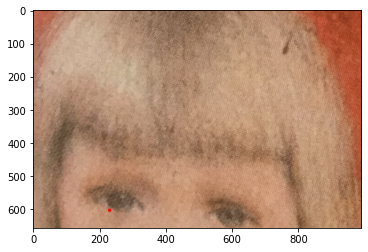

[1682.0428, 1453.5884]
(1462, 1151)


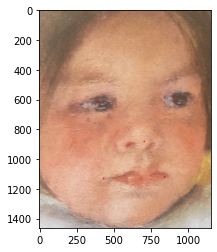

[1920.012, 1328.8733]
(337, 236)
[1852.5797, 1422.561]


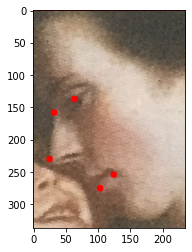

(250, 256)
[635.7127, 398.6284]


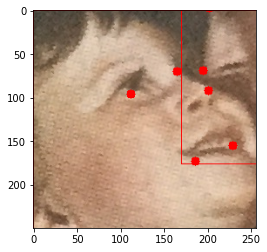

(374, 272)
[1282.4265, 1702.435]


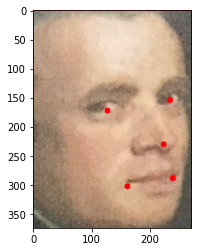

(301, 234)
[859.0656, 951.23773]


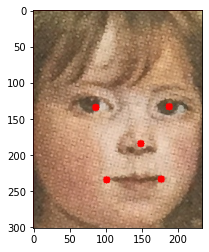

(413, 277)
[318.02716, 1508.3718]


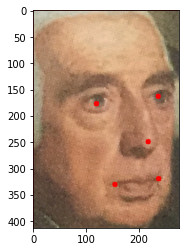

(248, 253)
[2416.1733, 1742.29]


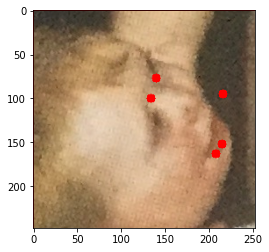

(276, 133)


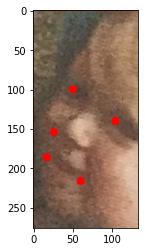

[1634.2775, 1598.8411]
(674, 565)


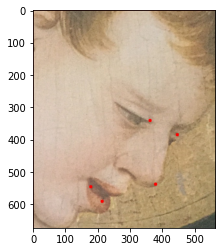

In [19]:
for i, resp in enumerate(dimensions):


  img = cv2.imread(img_array[i])
  def int_tuple(t):
            return tuple(int(x) for x in t)

  for key in resp:
      identity = resp[key]

      #---------------------
      confidence = identity["score"]

      rectangle_color = (0, 0, 255)                #(255, 255, 255)

      landmarks = identity["landmarks"]
      diameter = 5
      cv2.circle(img, int_tuple(landmarks["left_eye"]), diameter, (0, 0, 255), -1)
      print(landmarks['left_eye'])
      cv2.circle(img, int_tuple(landmarks["right_eye"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["nose"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["mouth_left"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["mouth_right"]), diameter, (0, 0, 255), -1)
      plt.show()
      facial_area = identity["facial_area"]

      cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), rectangle_color, 1)
      facial_img = img[facial_area[1]: facial_area[3], facial_area[0]: facial_area[2]]
      print(facial_img.shape[:2])
      plt.imshow(facial_img[:, :, ::-1])

  # plt.imshow(img[:, :, ::-1])
  # plt.axis('off')
  plt.show()
  # cv2.imwrite('outputs/output_1.jpg', img)
      

In [ ]:
i = 0
dimensions = []
img_array = []
for filename in os.listdir(folder):
    img_path = os.path.join(folder,filename)
    # continue
    # continue
    
    if i < 30:
      img_array.append(img_path)
      i += 1
      img = cv2.imread(img_path)

      resp = RetinaFace.detect_faces(img_path, threshold = 0.1)
      print(resp)
      dimensions.append(resp)

      

{'face_1': {'score': 0.9989205002784729, 'facial_area': [23, 38, 70, 89], 'landmarks': {'right_eye': [32.33581, 64.72384], 'left_eye': [52.03277, 58.72718], 'nose': [42.451782, 74.76874], 'mouth_right': [42.51659, 83.998276], 'mouth_left': [55.255547, 78.70442]}}}
{'face_1': {'score': 0.9992787837982178, 'facial_area': [1043, 982, 2087, 2230], 'landmarks': {'right_eye': [1493.915, 1420.5206], 'left_eye': [1899.7262, 1561.6678], 'nose': [1670.3926, 1810.27], 'mouth_right': [1377.3745, 1916.5995], 'mouth_left': [1633.9071, 2032.6147]}}}
{'face_1': {'score': 0.9982383251190186, 'facial_area': [483, 794, 1943, 2593], 'landmarks': {'right_eye': [1071.9933, 1430.9127], 'left_eye': [1710.0319, 1572.0101], 'nose': [1415.2511, 1982.8987], 'mouth_right': [990.82385, 2162.0286], 'mouth_left': [1440.8917, 2276.6108]}}}
{'face_1': {'score': 0.999645471572876, 'facial_area': [555, 1039, 1663, 2419], 'landmarks': {'right_eye': [758.2024, 1606.4082], 'left_eye': [1235.8315, 1614.4525], 'nose': [908.40

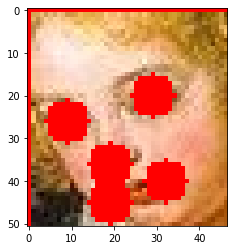

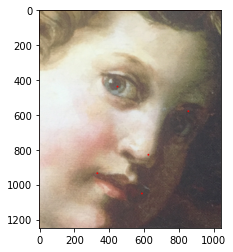

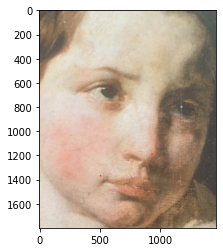

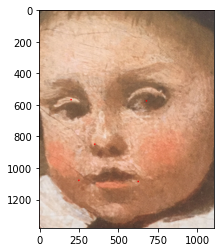

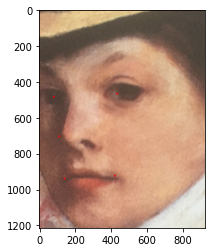

...

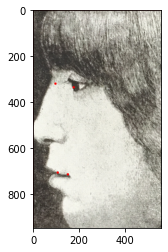

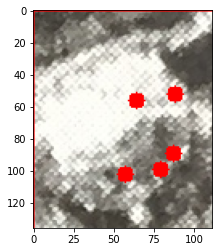

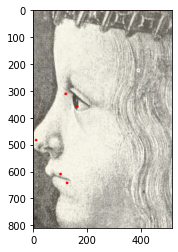

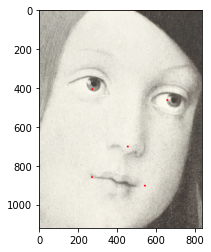

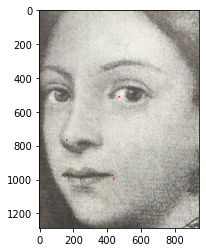

TypeError: ignored

In [ ]:
for i, resp in enumerate(dimensions):


  img = cv2.imread(img_array[i])
  def int_tuple(t):
            return tuple(int(x) for x in t)

  for key in resp:
      identity = resp[key] #add a case for if detect_face

      #---------------------
      confidence = identity["score"]

      rectangle_color = (0, 0, 255)                #(255, 255, 255)

      landmarks = identity["landmarks"]
      diameter = 5
      cv2.circle(img, int_tuple(landmarks["left_eye"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["right_eye"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["nose"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["mouth_left"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["mouth_right"]), diameter, (0, 0, 255), -1)
      plt.show()
      facial_area = identity["facial_area"]

      cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), rectangle_color, 1)
      facial_img = img[facial_area[1]: facial_area[3], facial_area[0]: facial_area[2]]
      plt.imshow(facial_img[:, :, ::-1])

  # plt.imshow(img[:, :, ::-1])
  # plt.axis('off')
  plt.show()
  # cv2.imwrite('outputs/output_1.jpg', img)

  #box around eye, to find the width
  #what if i subtract the mouth from eye, and then add it to the eye cordiante on the other side and that way i have the width

In [ ]:
dimensions

[{'face_1': {'score': 0.9989205002784729,
   'facial_area': [23, 38, 70, 89],
   'landmarks': {'right_eye': [32.33581, 64.72384],
    'left_eye': [52.03277, 58.72718],
    'nose': [42.451782, 74.76874],
    'mouth_right': [42.51659, 83.998276],
    'mouth_left': [55.255547, 78.70442]}}},
 {'face_1': {'score': 0.9992787837982178,
   'facial_area': [1043, 982, 2087, 2230],
   'landmarks': {'right_eye': [1493.915, 1420.5206],
    'left_eye': [1899.7262, 1561.6678],
    'nose': [1670.3926, 1810.27],
    'mouth_right': [1377.3745, 1916.5995],
    'mouth_left': [1633.9071, 2032.6147]}}},
 {'face_1': {'score': 0.9982383251190186,
   'facial_area': [483, 794, 1943, 2593],
   'landmarks': {'right_eye': [1071.9933, 1430.9127],
    'left_eye': [1710.0319, 1572.0101],
    'nose': [1415.2511, 1982.8987],
    'mouth_right': [990.82385, 2162.0286],
    'mouth_left': [1440.8917, 2276.6108]}}},
 {'face_1': {'score': 0.999645471572876,
   'facial_area': [555, 1039, 1663, 2419],
   'landmarks': {'right_e

In [1]:
!pip install centerface

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement centerface (from versions: none)
ERROR: No matching distribution found for centerface


In [ ]:
import cv2
import scipy.io as sio
import os
from centerface import CenterFace

i = 0
for filename in os.listdir(folder):
    img_path = os.path.join(folder,filename)
    # continue
    # continue
    
    if i < 10:
      
      i += 1
      
      frame = cv2.imread(img_path)
      plt.imshow(img[:, :, ::-1])
      h, w = 480, 640
      landmarks = True
      centerface = CenterFace(landmarks=landmarks, backend="tensorrt")
      
      plt.show()
      if landmarks:
        dets, lms = centerface(frame, h, w, threshold=0.35)
      else:
          dets = centerface(frame, threshold=0.35)

      for det in dets:
          boxes, score = det[:4], det[4]
          cv2.rectangle(frame, (int(boxes[0]), int(boxes[1])), (int(boxes[2]), int(boxes[3])), (2, 255, 0), 1)
      if landmarks:
          for lm in lms:
              for i in range(0, 5):
                  cv2.circle(frame, (int(lm[i * 2]), int(lm[i * 2 + 1])), 2, (0, 0, 255), -1)
      cv2.imshow('out', frame)



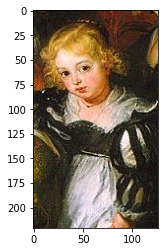

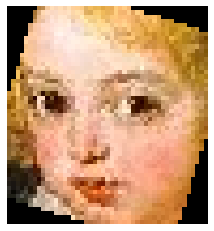

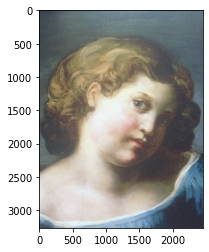

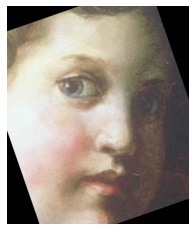

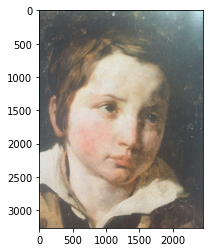

...

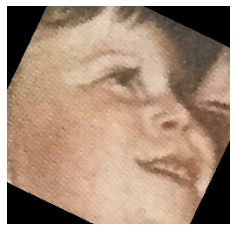

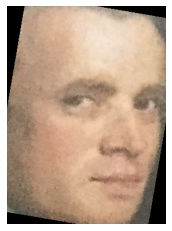

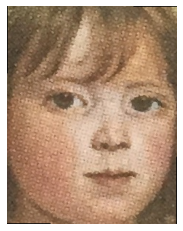

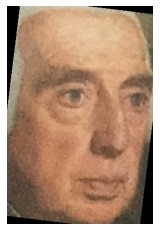

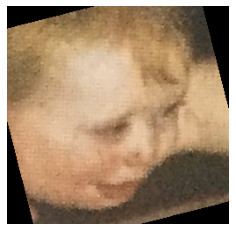

In [ ]:
#face orientation index
i = 0
for filename in os.listdir(folder):
    img_path = os.path.join(folder,filename)
    # continue
    # continue
    
    if i < 10:
      
      i += 1
      img = cv2.imread(img_path)
      plt.imshow(img[:, :, ::-1])
      faces = RetinaFace.extract_faces(img_path = img, align = True)
      plt.show()
      for face in faces:
          plt.imshow(face)
          plt.axis('off')
          plt.show()


In [ ]:
dimensions

[{'face_1': {'score': 0.9989205002784729,
   'facial_area': [23, 38, 70, 89],
   'landmarks': {'right_eye': [32.33581, 64.72384],
    'left_eye': [52.03277, 58.72718],
    'nose': [42.451782, 74.76874],
    'mouth_right': [42.51659, 83.998276],
    'mouth_left': [55.255547, 78.70442]}}},
 {'face_1': {'score': 0.9992787837982178,
   'facial_area': [1043, 982, 2087, 2230],
   'landmarks': {'right_eye': [1493.915, 1420.5206],
    'left_eye': [1899.7262, 1561.6678],
    'nose': [1670.3926, 1810.27],
    'mouth_right': [1377.3745, 1916.5995],
    'mouth_left': [1633.9071, 2032.6147]}}},
 {'face_1': {'score': 0.9982383251190186,
   'facial_area': [483, 794, 1943, 2593],
   'landmarks': {'right_eye': [1071.9933, 1430.9127],
    'left_eye': [1710.0319, 1572.0101],
    'nose': [1415.2511, 1982.8987],
    'mouth_right': [990.82385, 2162.0286],
    'mouth_left': [1440.8917, 2276.6108]}}},
 {'face_1': {'score': 0.999645471572876,
   'facial_area': [555, 1039, 1663, 2419],
   'landmarks': {'right_e

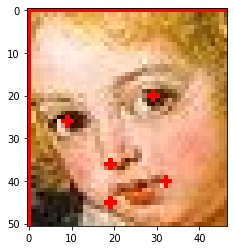

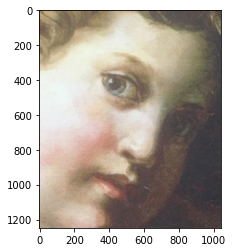

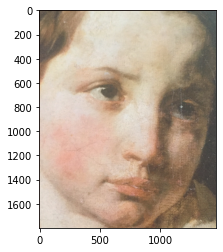

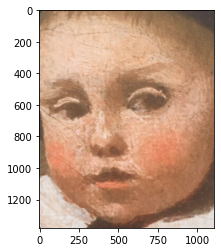

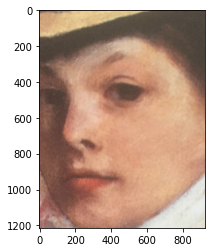

...

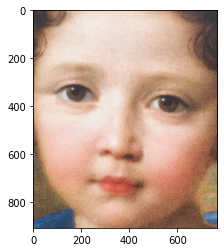

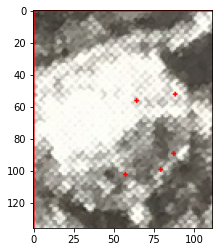

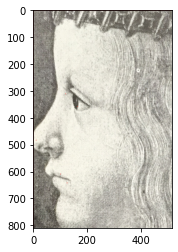

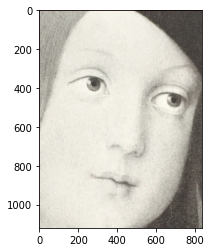

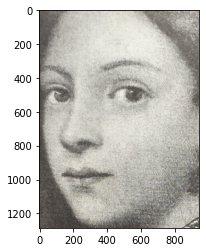

TypeError: ignored

In [ ]:
for i, resp in enumerate(dimensions):


  img = cv2.imread(img_array[i])
  def int_tuple(t):
            return tuple(int(x) for x in t)

  for key in resp:
      identity = resp[key]

      #---------------------
      confidence = identity["score"]

      rectangle_color = (0, 0, 255)                #(255, 255, 255)

      landmarks = identity["landmarks"]
      diameter = 1
      cv2.circle(img, int_tuple(landmarks["left_eye"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["right_eye"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["nose"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["mouth_left"]), diameter, (0, 0, 255), -1)
      cv2.circle(img, int_tuple(landmarks["mouth_right"]), diameter, (0, 0, 255), -1)

      facial_area = identity["facial_area"]

      cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), rectangle_color, 1)
      facial_img = img[facial_area[1]: facial_area[3], facial_area[0]: facial_area[2]]
      plt.imshow(facial_img[:, :, ::-1])

  # plt.imshow(img[:, :, ::-1])
  # plt.axis('off')
  plt.show()
  # cv2.imwrite('outputs/output_1.jpg', img)
      # resp = RetinaFace.detect_faces(img)
      # coordinates.append(resp) 
      # image = Image.open(img)
      # plt.imshow(image)
      # plt.show()

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to 0 degrees


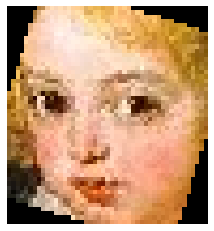

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to 30 degrees


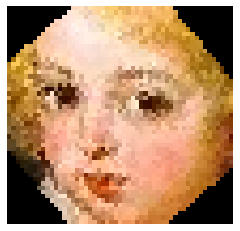

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to 45 degrees


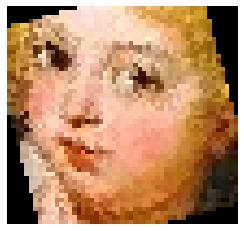

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to 60 degrees


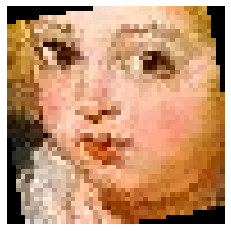

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to 90 degrees


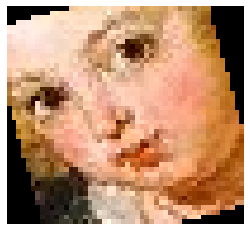

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to -30 degrees


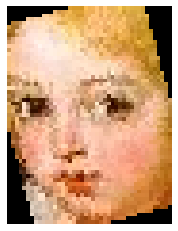

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to -45 degrees


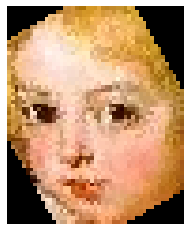

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to -60 degrees


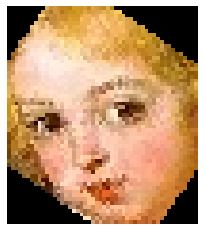

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg to -90 degrees


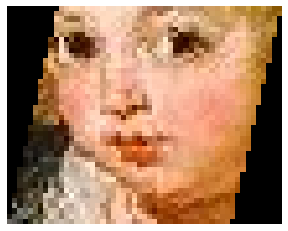

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to 0 degrees


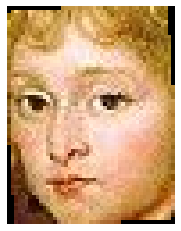

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to 30 degrees


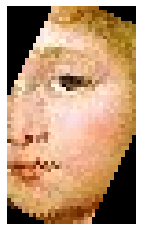

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to 45 degrees


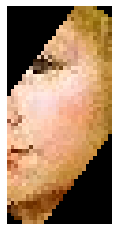

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to 60 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to 90 degrees


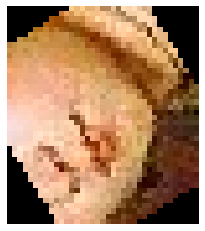

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to -30 degrees


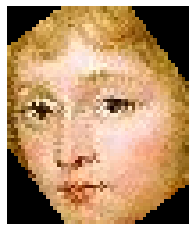

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to -45 degrees


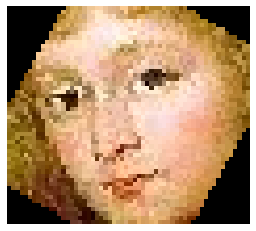

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to -60 degrees


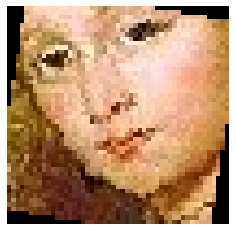

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg to -90 degrees


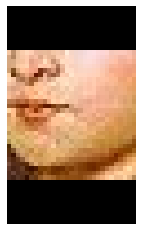

In [ ]:
#------------------------------
#extract face with alignment

img_paths = ["/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_1.jpg", "/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_2.jpg"]
rotate_angles = [0, 30, 45, 60, 90, -30, -45, -60, -90]

for img_path in img_paths:

    #resp = RetinaFace.extract_faces(img_path = img_path, align = True)
    img = cv2.imread(img_path)
    img_base = img.copy()

    for angle in rotate_angles:
        print(f"rotating {img_path} to {angle} degrees")
        img = img_base.copy()
        img = Image.fromarray(img)
        img = np.array(img.rotate(angle))

        faces = RetinaFace.extract_faces(img_path = img, align = True)

        for face in faces:
            plt.imshow(face)
            plt.axis('off')
            plt.show()
            #cv2.imwrite('outputs/'+img_path.split("/")[1], face[:, :, ::-1])

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to 0 degrees


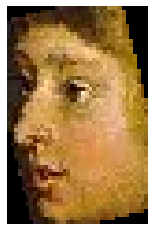

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to 30 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to 45 degrees


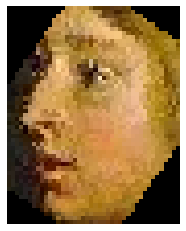

rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to 60 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to 90 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to -30 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to -45 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to -60 degrees
rotating /content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg to -90 degrees


In [ ]:
#------------------------------
#extract face with alignment

img_paths = ["/content/drive/MyDrive/LizaProjetEnfance/Sarde_Etude1_ProjetEnfants/001_12_06_3.jpg"]
rotate_angles = [0, 30, 45, 60, 90, -30, -45, -60, -90]

for img_path in img_paths:

    #resp = RetinaFace.extract_faces(img_path = img_path, align = True)
    img = cv2.imread(img_path)
    img_base = img.copy()

    for angle in rotate_angles:
        print(f"rotating {img_path} to {angle} degrees")
        img = img_base.copy()
        img = Image.fromarray(img)
        img = np.array(img.rotate(angle))

        faces = RetinaFace.extract_faces(img_path = img, align = True)

        for face in faces:
            plt.imshow(face)
            plt.axis('off')
            plt.show()
            #cv2.imwrite('outputs/'+img_path.split("/")[1], face[:, :, ::-1])